In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import time
from tensorflow.examples.tutorials.mnist import input_data
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
def tic():
    global startTime_for_tictoc
    startTime_for_tictoc = time.time()

def toc():
    return time.time() - startTime_for_tictoc

In [3]:
def load_data():
    mnist = input_data.read_data_sets('MNIST_data/')
    images = np.append(np.append(mnist.train.images, mnist.validation.images, axis=0), mnist.test.images, axis=0)
    return images

In [4]:
def generator_output(noise_input, n_1, n_out, reuse=False):
    with tf.variable_scope('generator', reuse=reuse):
        A1 = tf.contrib.layers.fully_connected(noise_input, n_1, activation_fn=tf.nn.relu, scope='A1')
        A1_dropout = tf.contrib.layers.dropout(A1, keep_prob=0.75, is_training=True, scope='A1_dropout')
        A_out = tf.contrib.layers.fully_connected(A1_dropout, n_out, activation_fn=tf.nn.tanh, scope='A_out')
        return A_out

In [5]:
def discriminator_output(images, n_1, reuse=False):
    with tf.variable_scope('discriminator', reuse=reuse):
        A1 = tf.contrib.layers.fully_connected(images, n_1, activation_fn=tf.nn.relu, scope='A1')
        A1_dropout = tf.contrib.layers.dropout(A1, keep_prob=0.75, is_training=True, scope='A1_dropout')
        Z_out = tf.contrib.layers.fully_connected(A1_dropout, 1, activation_fn=None, scope='Z_out')
        return Z_out

In [6]:
def MNIST_GAN(hyperparams):
    tf.reset_default_graph()
    mnist_images = load_data() * 2 - 1
    noise_size = hyperparams['noise_size']
    batch_size = hyperparams['batch_size']
    epoch = hyperparams['epoch']
    generator_n_1 = hyperparams['generator_n_1']
    discriminator_n_1 = hyperparams['discriminator_n_1']
    learning_rate = hyperparams['learning_rate']
    sample_size = hyperparams['sample_size']
    data_size = mnist_images.shape[0]
    image_size = mnist_images.shape[1]
    total_batches = np.ceil(data_size / batch_size).astype(np.int32)
    real_images = tf.placeholder(tf.float32, (None, image_size), name='real_images')
    noise_input = tf.placeholder(tf.float32, (None, noise_size), name='noise_input')
    fake_images = generator_output(noise_input, generator_n_1, image_size)
    real_logits = discriminator_output(real_images, discriminator_n_1)
    fake_logits = discriminator_output(fake_images, discriminator_n_1, reuse=True)
    dis_real_cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=real_logits, labels=tf.ones_like(real_logits)))
    dis_fake_cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_logits, labels=tf.zeros_like(fake_logits)))
    dis_cost = tf.divide(tf.add(dis_real_cost, dis_fake_cost), 2)
    gen_cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_logits, labels=tf.ones_like(fake_logits)))
    trainable_vars = tf.trainable_variables()
    gen_vars = [var for var in trainable_vars if var.name.startswith('generator')]
    dis_vars = [var for var in trainable_vars if var.name.startswith('discriminator')]
    gen_optimize = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(gen_cost, var_list=gen_vars)
    dis_optimize = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(dis_cost, var_list=dis_vars)
    costs_history = []
    generate_sample_history = np.empty((0, sample_size, image_size))
    sample_noise_input = np.random.uniform(low=-1, high=1, size=(sample_size, noise_size))
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    with tf.Session(config=config) as sess:
        sess.run(tf.global_variables_initializer())
        for i in range(epoch):
            tic()
            noises = np.empty((0, noise_size))
            for j in range(total_batches):
                index_front = j * batch_size
                index_end = (j + 1) * batch_size if (j + 1) * batch_size < data_size else data_size
                images_batch = mnist_images[index_front:index_end].reshape(-1, image_size)
                noise_batch = np.random.uniform(low=-1, high=1, size=(index_end - index_front, noise_size))
                sess.run(dis_optimize, feed_dict={real_images:images_batch, noise_input:noise_batch})
                sess.run(gen_optimize, feed_dict={noise_input:noise_batch})
                noises = np.append(noises, noise_batch, axis=0)
            dis_epoch_cost_real, dis_epoch_cost_fake, dis_epoch_cost, gen_epoch_cost = sess.run([dis_real_cost, dis_fake_cost, dis_cost, gen_cost], feed_dict={real_images:mnist_images, noise_input:noises})
            costs_history.append((dis_epoch_cost_real, dis_epoch_cost_fake, dis_epoch_cost, gen_epoch_cost))
            generate_sample_history = np.append(generate_sample_history, sess.run(fake_images, feed_dict={noise_input:sample_noise_input}).reshape(1, -1, image_size), axis=0)
            print('Epoch {}/{} Time Elapsed: {:.2f}s'.format(i + 1, epoch, toc()))
            print('Discriminator Cost: {:.4f} (Real: {:.4f} + Fake: {:.4f}) Generator Cost: {:.4f}'.format(dis_epoch_cost, dis_epoch_cost_real, dis_epoch_cost_fake, gen_epoch_cost))
        return costs_history, generate_sample_history

In [7]:
hyperparams={
    'noise_size': 100,
    'batch_size': 64,
    'epoch': 500,
    'generator_n_1': 128,
    'discriminator_n_1': 128,
    'learning_rate': 0.001,
    'sample_size': 10
}
costs_history, generate_sample_history = MNIST_GAN(hyperparams)

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz
Epoch 1/500 Time Elapsed: 18.97s
Discriminator Cost: 0.2653 (Real: 0.3195 + Fake: 0.2110) Generator Cost: 1.9296
Epoch 2/500 Time Elapsed: 16.12s
Discriminator Cost: 0.2283 (Real: 0.2143 + Fake: 0.2423) Generator Cost: 1.9879
Epoch 3/500 Time Elapsed: 15.75s
Discriminator Cost: 0.4988 (Real: 0.6411 + Fake: 0.3564) Generator Cost: 1.4505
Epoch 4/500 Time Elapsed: 15.63s
Discriminator Cost: 0.4529 (Real: 0.4476 + Fake: 0.4582) Generator Cost: 1.5558
Epoch 5/500 Time Elapsed: 15.24s
Discriminator Cost: 0.5774 (Real: 0.5680 + Fake: 0.5868) Generator Cost: 0.9459
Epoch 6/500 Time Elapsed: 16.46s
Discriminator Cost: 0.5718 (Real: 0.4947 + Fake: 0.6489) Generator Cost: 0.8958
Epoch 7/500 Time Elapsed: 17.26s
Discriminator Cost: 0.5790 (Real: 0.5698 + Fake: 0.5882) Generator Cost: 0.9000
Epoch 8/500 Tim

Epoch 72/500 Time Elapsed: 16.19s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 73/500 Time Elapsed: 15.40s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 74/500 Time Elapsed: 16.18s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 75/500 Time Elapsed: 15.17s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 76/500 Time Elapsed: 15.28s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 77/500 Time Elapsed: 15.46s
Discriminator Cost: 0.6931 (Real: 0.6851 + Fake: 0.7011) Generator Cost: 0.6853
Epoch 78/500 Time Elapsed: 15.48s
Discriminator Cost: 0.7086 (Real: 0.5293 + Fake: 0.8879) Generator Cost: 0.5311
Epoch 79/500 Time Elapsed: 15.47s
Discriminator Cost: 0.6931 (Real: 0.6917 + Fake: 0.6946) Generator Cost: 0.6917
Epoch 80/500 Time Elapsed: 15.52s
Discriminator Cost: 0.6931 (Real: 0.6925 + Fake: 0.693

Epoch 144/500 Time Elapsed: 15.54s
Discriminator Cost: 0.6932 (Real: 0.6839 + Fake: 0.7024) Generator Cost: 0.6841
Epoch 145/500 Time Elapsed: 17.42s
Discriminator Cost: 0.6932 (Real: 0.6896 + Fake: 0.6967) Generator Cost: 0.6896
Epoch 146/500 Time Elapsed: 16.86s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6932) Generator Cost: 0.6931
Epoch 147/500 Time Elapsed: 15.42s
Discriminator Cost: 0.6932 (Real: 0.6891 + Fake: 0.6972) Generator Cost: 0.6891
Epoch 148/500 Time Elapsed: 16.87s
Discriminator Cost: 0.6934 (Real: 0.6717 + Fake: 0.7150) Generator Cost: 0.6717
Epoch 149/500 Time Elapsed: 15.17s
Discriminator Cost: 0.6932 (Real: 0.6932 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 150/500 Time Elapsed: 15.16s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 151/500 Time Elapsed: 15.75s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 152/500 Time Elapsed: 15.79s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fa

Epoch 216/500 Time Elapsed: 16.65s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 217/500 Time Elapsed: 15.20s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 218/500 Time Elapsed: 15.51s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 219/500 Time Elapsed: 15.38s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 220/500 Time Elapsed: 15.19s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 221/500 Time Elapsed: 15.37s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 222/500 Time Elapsed: 15.97s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 223/500 Time Elapsed: 15.44s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 224/500 Time Elapsed: 15.72s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fa

Epoch 288/500 Time Elapsed: 15.31s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 289/500 Time Elapsed: 15.28s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 290/500 Time Elapsed: 15.89s
Discriminator Cost: 0.6931 (Real: 0.6932 + Fake: 0.6931) Generator Cost: 0.6932
Epoch 291/500 Time Elapsed: 15.04s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 292/500 Time Elapsed: 15.49s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 293/500 Time Elapsed: 16.87s
Discriminator Cost: 0.6931 (Real: 0.6932 + Fake: 0.6931) Generator Cost: 0.6932
Epoch 294/500 Time Elapsed: 17.63s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 295/500 Time Elapsed: 15.47s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 296/500 Time Elapsed: 15.31s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fa

Epoch 360/500 Time Elapsed: 15.93s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 361/500 Time Elapsed: 15.63s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 362/500 Time Elapsed: 15.10s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 363/500 Time Elapsed: 16.02s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 364/500 Time Elapsed: 16.43s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 365/500 Time Elapsed: 15.32s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 366/500 Time Elapsed: 15.48s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 367/500 Time Elapsed: 15.29s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 368/500 Time Elapsed: 16.86s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fa

Epoch 432/500 Time Elapsed: 15.84s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 433/500 Time Elapsed: 17.15s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 434/500 Time Elapsed: 15.33s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 435/500 Time Elapsed: 15.16s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 436/500 Time Elapsed: 15.24s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 437/500 Time Elapsed: 15.80s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 438/500 Time Elapsed: 15.28s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 439/500 Time Elapsed: 15.17s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fake: 0.6931) Generator Cost: 0.6931
Epoch 440/500 Time Elapsed: 18.10s
Discriminator Cost: 0.6931 (Real: 0.6931 + Fa

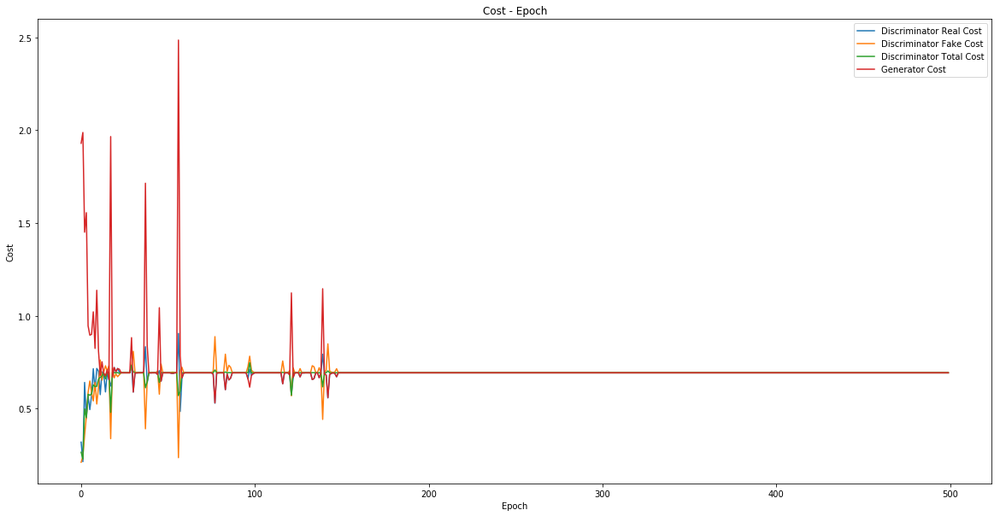

In [8]:
costs = np.array(costs_history).T
plt.figure(figsize=(20, 10))
plt.ylabel('Cost')
plt.xlabel('Epoch')
plt.title('Cost - Epoch')
plt.plot(costs[0], label='Discriminator Real Cost')
plt.plot(costs[1], label='Discriminator Fake Cost')
plt.plot(costs[2], label='Discriminator Total Cost')
plt.plot(costs[3], label='Generator Cost')
plt.legend(loc='best')
plt.show()

Epoch 1:


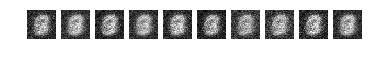

Epoch 2:


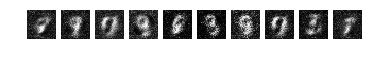

Epoch 3:


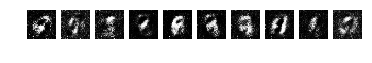

Epoch 4:


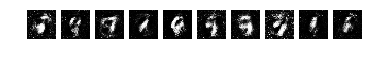

Epoch 5:


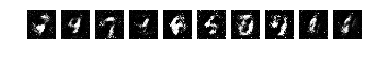

Epoch 6:


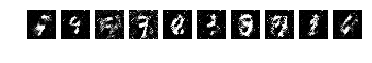

Epoch 7:


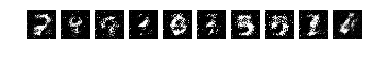

Epoch 8:


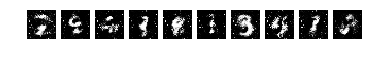

Epoch 9:


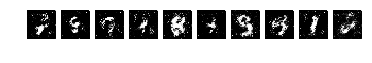

Epoch 10:


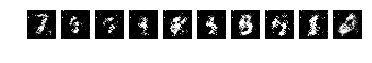

Epoch 11:


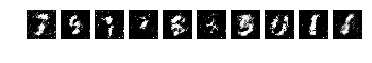

Epoch 12:


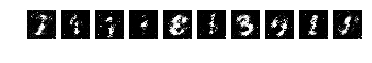

Epoch 13:


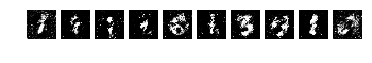

Epoch 14:


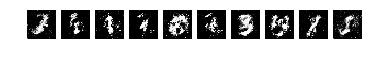

Epoch 15:


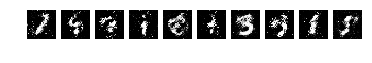

Epoch 16:


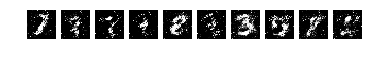

Epoch 17:


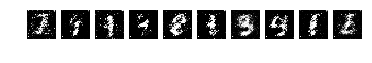

Epoch 18:


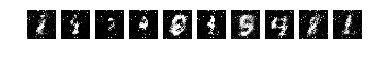

Epoch 19:


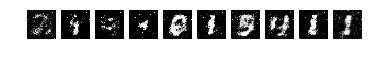

Epoch 20:


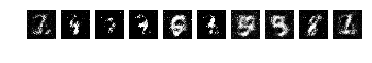

Epoch 21:


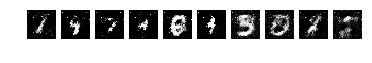

Epoch 22:


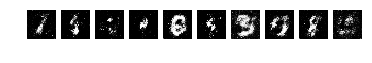

Epoch 23:


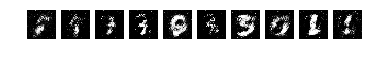

Epoch 24:


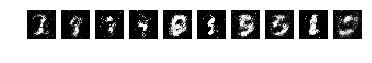

Epoch 25:


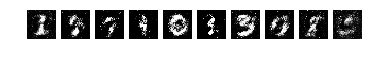

Epoch 26:


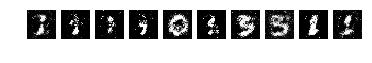

Epoch 27:


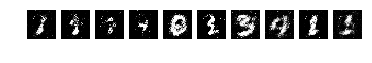

Epoch 28:


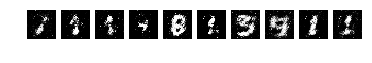

Epoch 29:


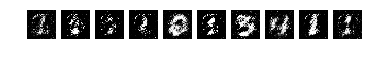

Epoch 30:


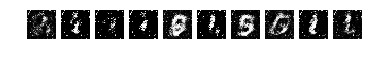

Epoch 31:


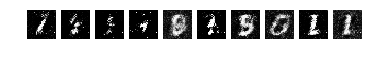

Epoch 32:


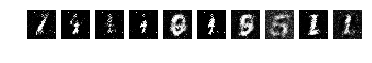

Epoch 33:


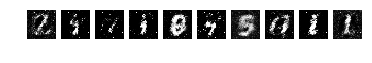

Epoch 34:


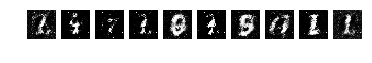

Epoch 35:


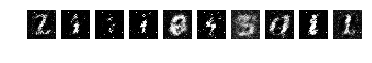

Epoch 36:


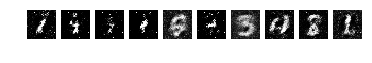

Epoch 37:


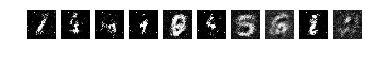

Epoch 38:


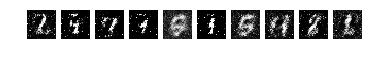

Epoch 39:


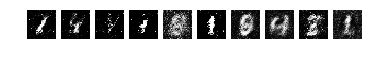

Epoch 40:


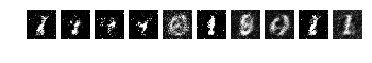

Epoch 41:


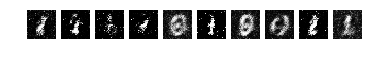

Epoch 42:


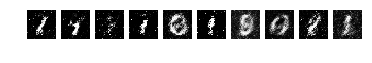

Epoch 43:


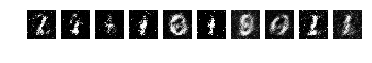

Epoch 44:


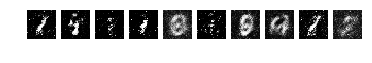

Epoch 45:


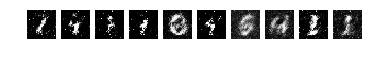

Epoch 46:


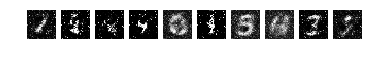

Epoch 47:


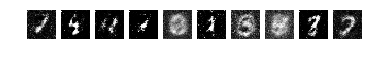

Epoch 48:


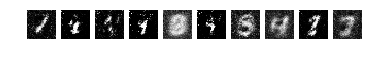

Epoch 49:


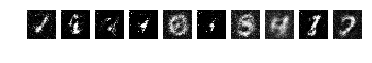

Epoch 50:


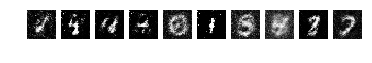

Epoch 51:


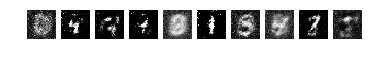

Epoch 52:


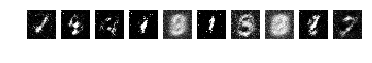

Epoch 53:


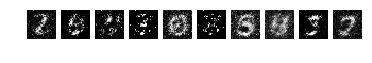

Epoch 54:


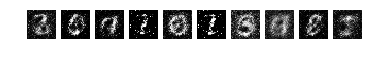

Epoch 55:


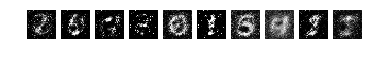

Epoch 56:


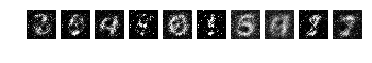

Epoch 57:


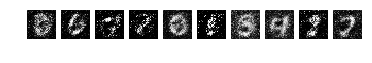

Epoch 58:


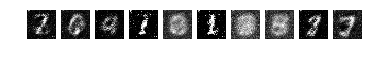

Epoch 59:


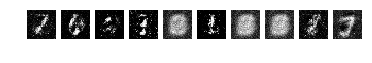

Epoch 60:


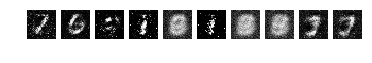

Epoch 61:


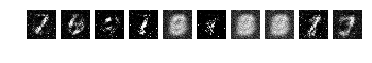

Epoch 62:


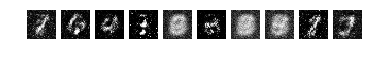

Epoch 63:


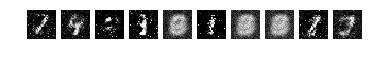

Epoch 64:


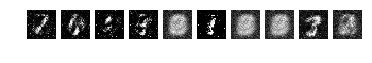

Epoch 65:


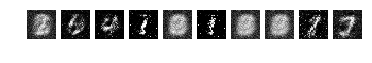

Epoch 66:


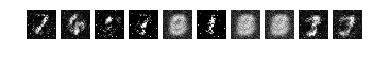

Epoch 67:


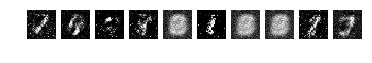

Epoch 68:


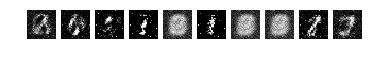

Epoch 69:


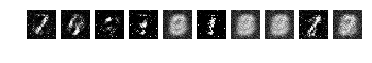

Epoch 70:


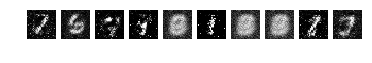

Epoch 71:


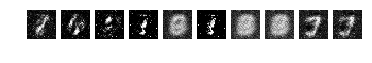

Epoch 72:


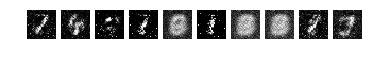

Epoch 73:


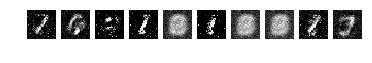

Epoch 74:


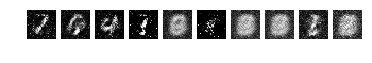

Epoch 75:


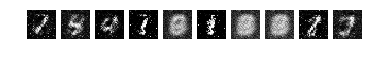

Epoch 76:


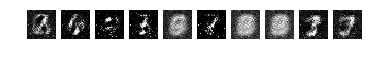

Epoch 77:


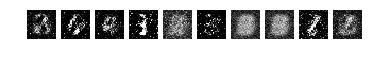

Epoch 78:


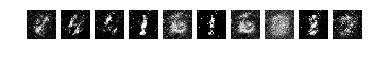

Epoch 79:


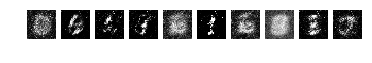

Epoch 80:


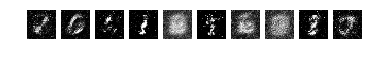

Epoch 81:


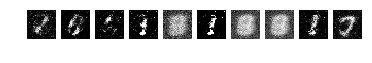

Epoch 82:


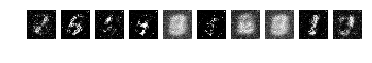

Epoch 83:


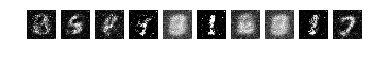

Epoch 84:


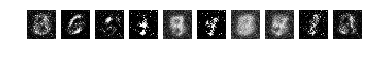

Epoch 85:


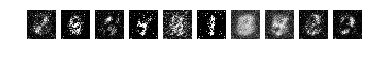

Epoch 86:


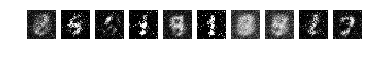

Epoch 87:


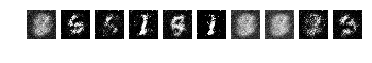

Epoch 88:


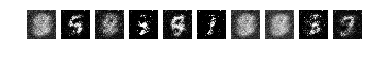

Epoch 89:


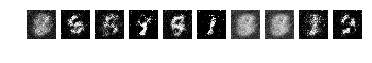

Epoch 90:


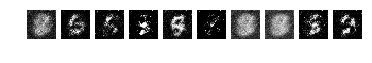

Epoch 91:


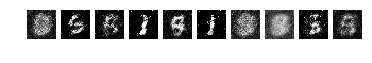

Epoch 92:


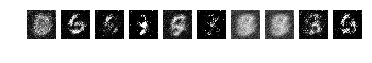

Epoch 93:


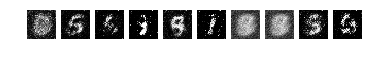

Epoch 94:


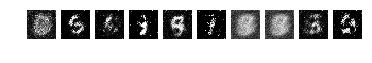

Epoch 95:


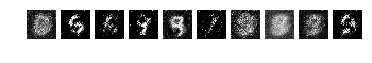

Epoch 96:


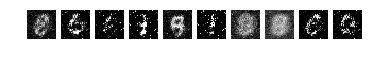

Epoch 97:


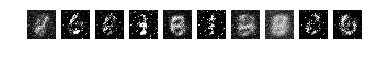

Epoch 98:


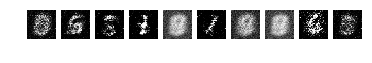

Epoch 99:


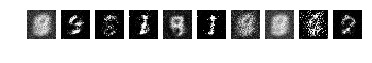

Epoch 100:


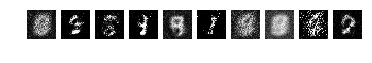

Epoch 101:


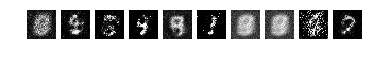

Epoch 102:


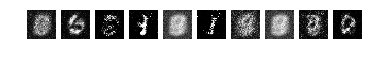

Epoch 103:


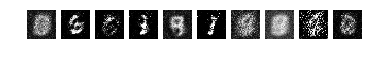

Epoch 104:


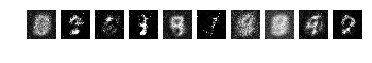

Epoch 105:


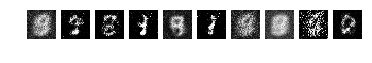

Epoch 106:


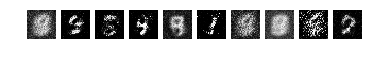

Epoch 107:


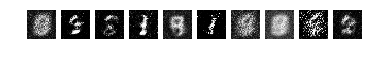

Epoch 108:


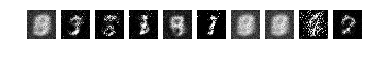

Epoch 109:


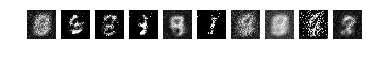

Epoch 110:


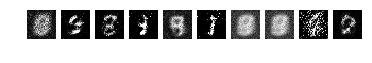

Epoch 111:


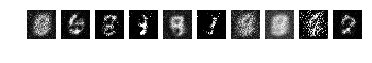

Epoch 112:


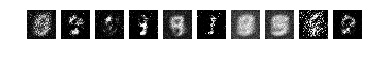

Epoch 113:


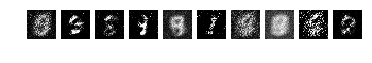

Epoch 114:


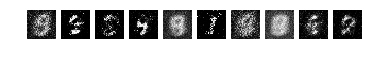

Epoch 115:


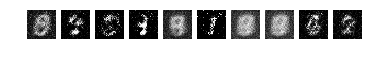

Epoch 116:


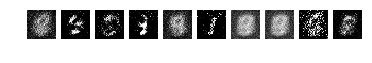

Epoch 117:


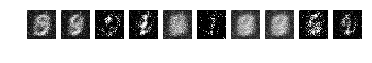

Epoch 118:


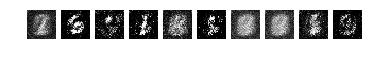

Epoch 119:


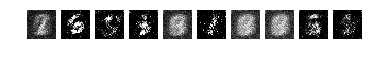

Epoch 120:


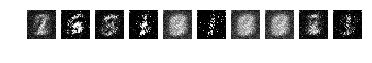

Epoch 121:


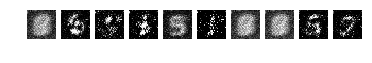

Epoch 122:


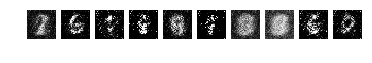

Epoch 123:


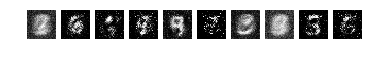

Epoch 124:


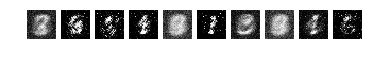

Epoch 125:


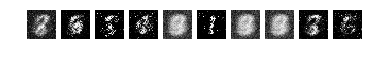

Epoch 126:


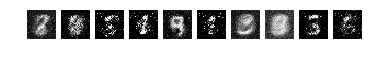

Epoch 127:


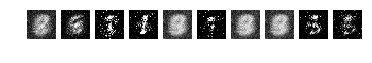

Epoch 128:


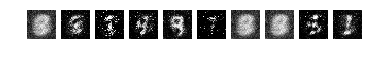

Epoch 129:


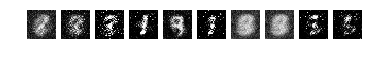

Epoch 130:


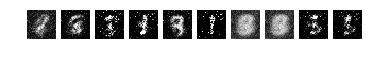

Epoch 131:


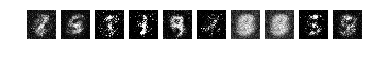

Epoch 132:


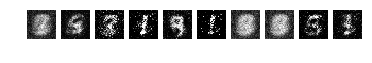

Epoch 133:


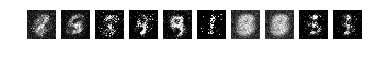

Epoch 134:


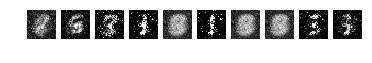

Epoch 135:


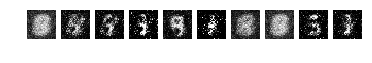

Epoch 136:


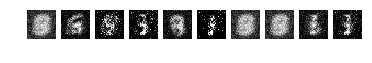

Epoch 137:


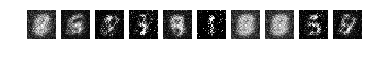

Epoch 138:


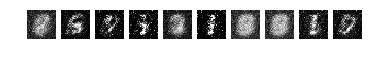

Epoch 139:


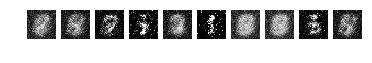

Epoch 140:


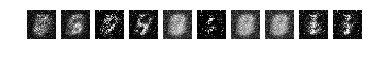

Epoch 141:


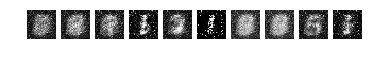

Epoch 142:


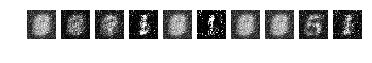

Epoch 143:


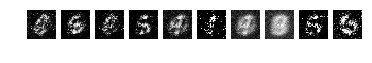

Epoch 144:


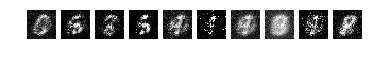

Epoch 145:


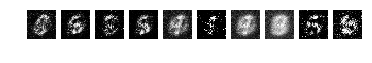

Epoch 146:


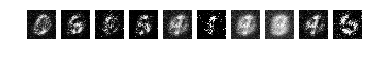

Epoch 147:


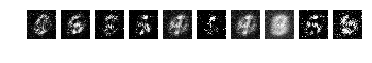

Epoch 148:


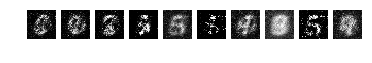

Epoch 149:


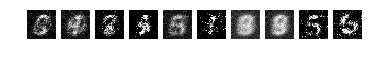

Epoch 150:


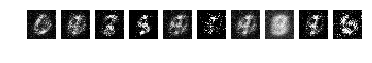

Epoch 151:


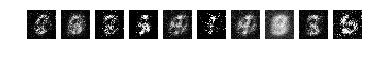

Epoch 152:


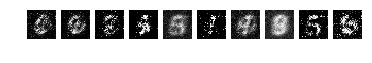

Epoch 153:


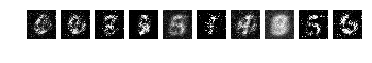

Epoch 154:


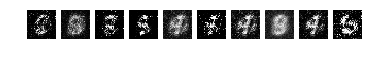

Epoch 155:


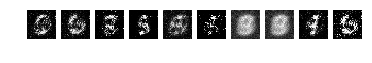

Epoch 156:


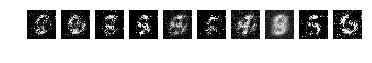

Epoch 157:


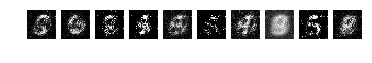

Epoch 158:


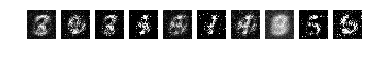

Epoch 159:


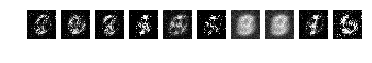

Epoch 160:


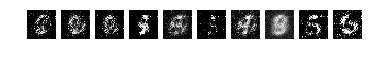

Epoch 161:


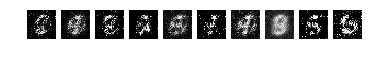

Epoch 162:


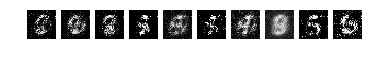

Epoch 163:


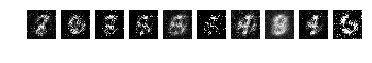

Epoch 164:


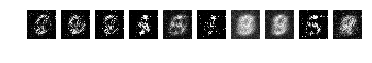

Epoch 165:


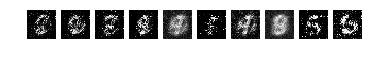

Epoch 166:


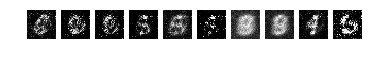

Epoch 167:


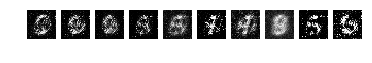

Epoch 168:


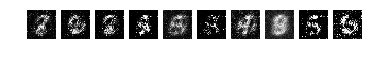

Epoch 169:


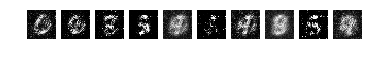

Epoch 170:


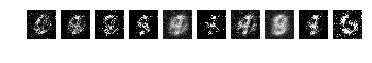

Epoch 171:


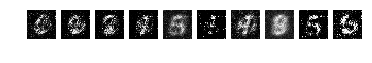

Epoch 172:


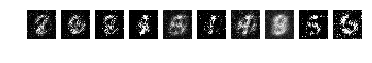

Epoch 173:


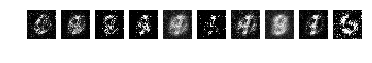

Epoch 174:


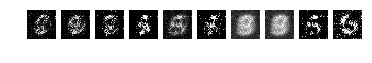

Epoch 175:


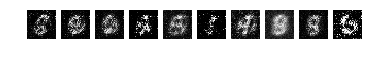

Epoch 176:


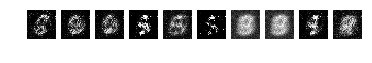

Epoch 177:


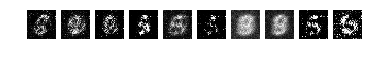

Epoch 178:


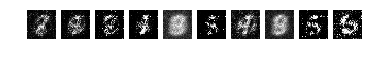

Epoch 179:


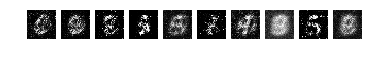

Epoch 180:


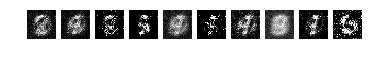

Epoch 181:


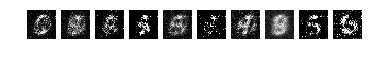

Epoch 182:


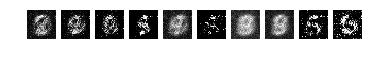

Epoch 183:


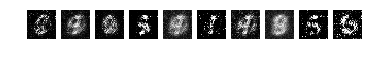

Epoch 184:


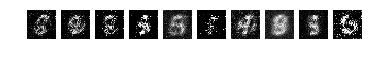

Epoch 185:


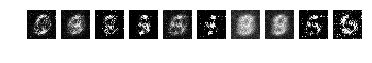

Epoch 186:


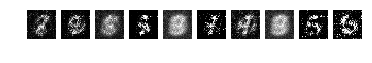

Epoch 187:


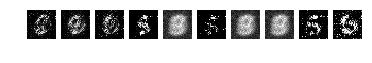

Epoch 188:


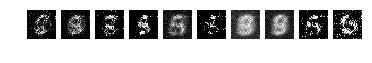

Epoch 189:


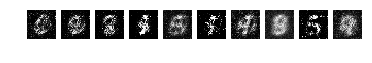

Epoch 190:


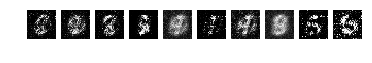

Epoch 191:


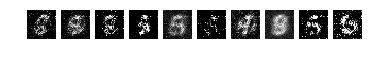

Epoch 192:


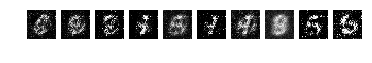

Epoch 193:


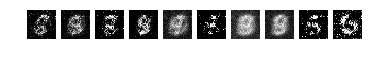

Epoch 194:


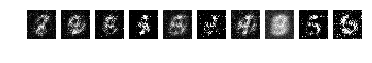

Epoch 195:


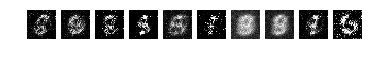

Epoch 196:


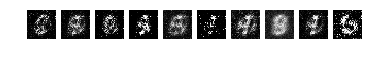

Epoch 197:


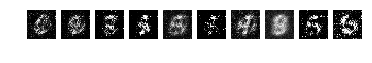

Epoch 198:


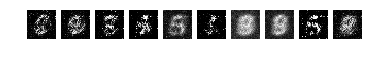

Epoch 199:


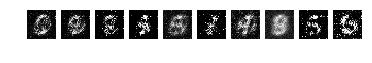

Epoch 200:


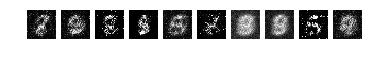

Epoch 201:


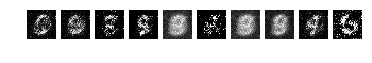

Epoch 202:


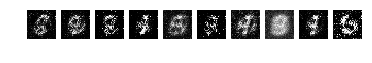

Epoch 203:


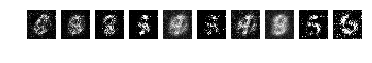

Epoch 204:


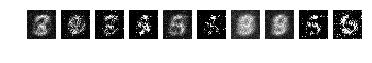

Epoch 205:


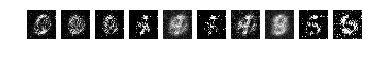

Epoch 206:


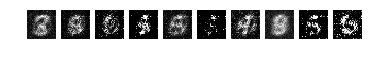

Epoch 207:


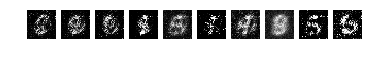

Epoch 208:


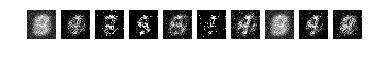

Epoch 209:


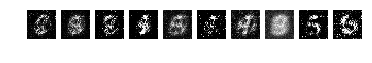

Epoch 210:


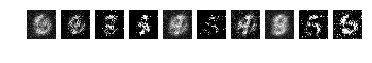

Epoch 211:


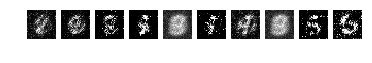

Epoch 212:


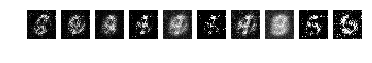

Epoch 213:


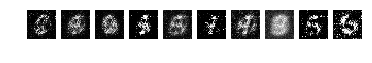

Epoch 214:


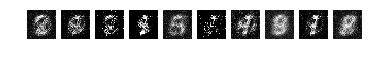

Epoch 215:


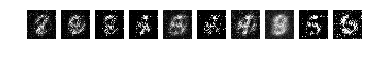

Epoch 216:


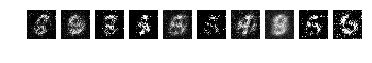

Epoch 217:


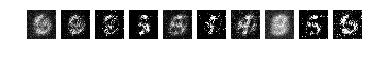

Epoch 218:


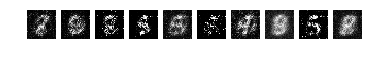

Epoch 219:


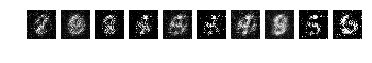

Epoch 220:


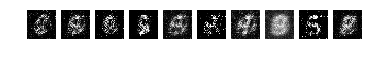

Epoch 221:


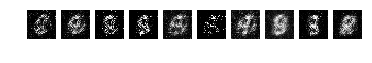

Epoch 222:


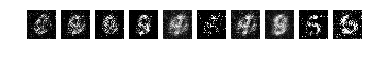

Epoch 223:


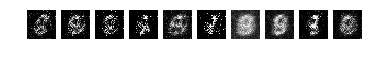

Epoch 224:


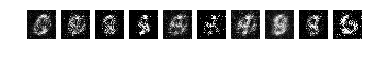

Epoch 225:


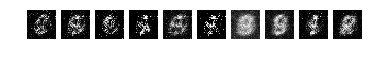

Epoch 226:


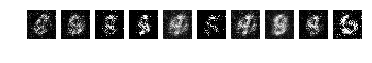

Epoch 227:


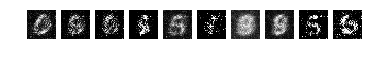

Epoch 228:


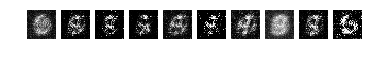

Epoch 229:


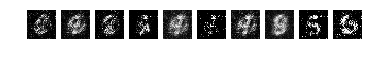

Epoch 230:


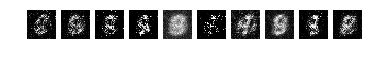

Epoch 231:


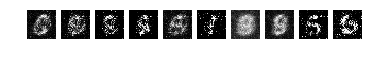

Epoch 232:


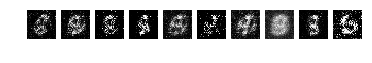

Epoch 233:


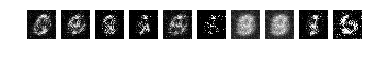

Epoch 234:


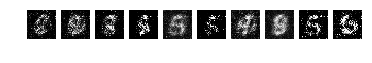

Epoch 235:


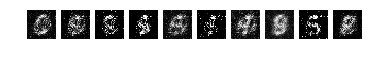

Epoch 236:


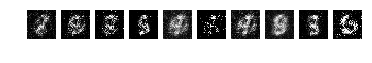

Epoch 237:


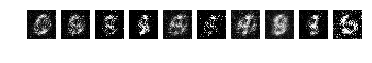

Epoch 238:


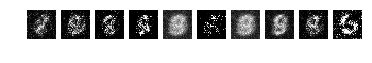

Epoch 239:


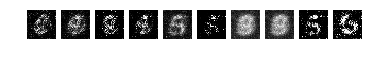

Epoch 240:


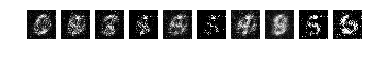

Epoch 241:


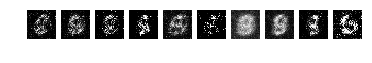

Epoch 242:


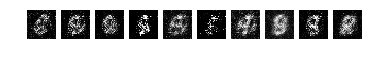

Epoch 243:


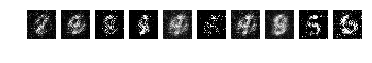

Epoch 244:


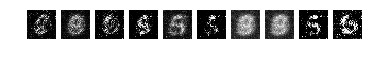

Epoch 245:


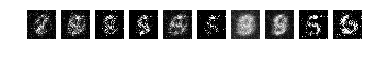

Epoch 246:


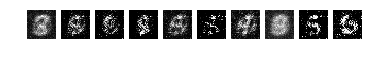

Epoch 247:


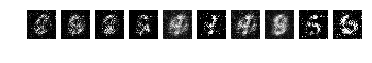

Epoch 248:


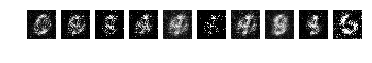

Epoch 249:


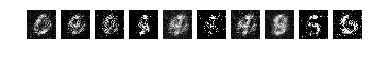

Epoch 250:


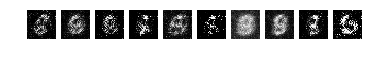

Epoch 251:


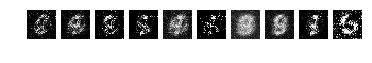

Epoch 252:


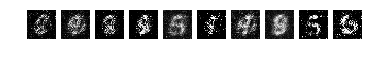

Epoch 253:


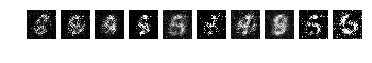

Epoch 254:


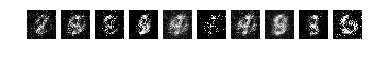

Epoch 255:


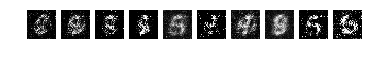

Epoch 256:


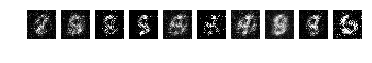

Epoch 257:


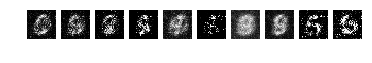

Epoch 258:


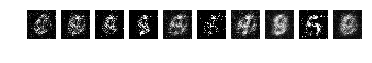

Epoch 259:


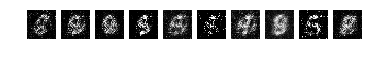

Epoch 260:


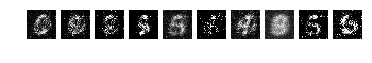

Epoch 261:


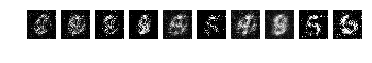

Epoch 262:


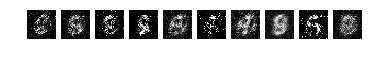

Epoch 263:


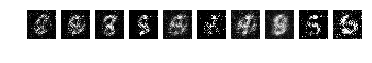

Epoch 264:


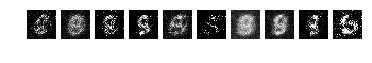

Epoch 265:


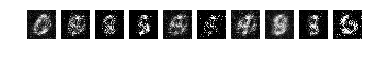

Epoch 266:


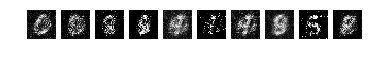

Epoch 267:


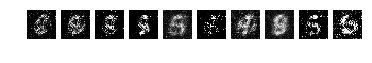

Epoch 268:


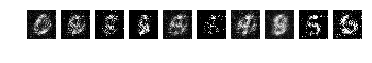

Epoch 269:


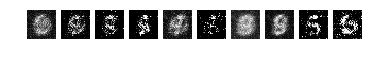

Epoch 270:


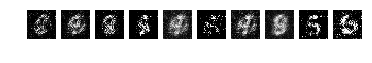

Epoch 271:


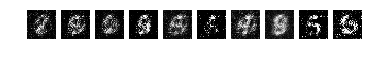

Epoch 272:


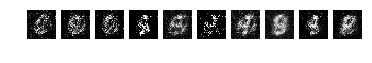

Epoch 273:


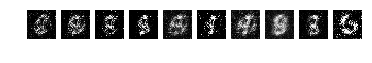

Epoch 274:


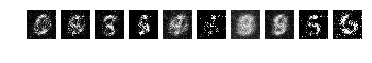

Epoch 275:


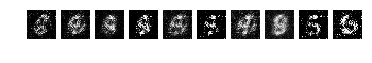

Epoch 276:


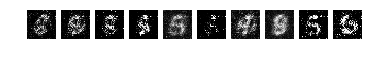

Epoch 277:


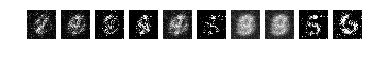

Epoch 278:


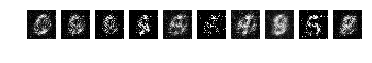

Epoch 279:


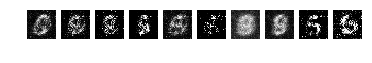

Epoch 280:


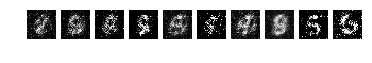

Epoch 281:


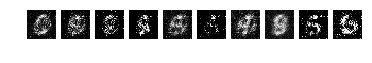

Epoch 282:


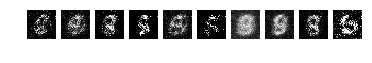

Epoch 283:


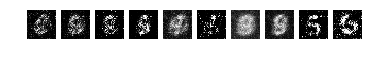

Epoch 284:


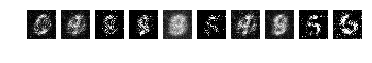

Epoch 285:


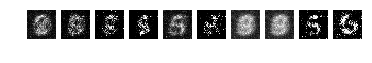

Epoch 286:


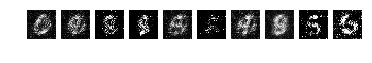

Epoch 287:


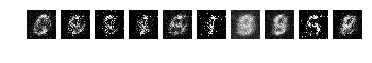

Epoch 288:


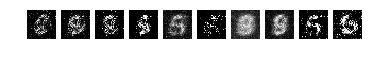

Epoch 289:


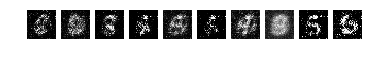

Epoch 290:


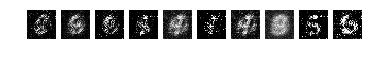

Epoch 291:


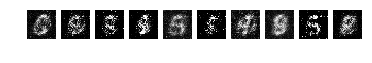

Epoch 292:


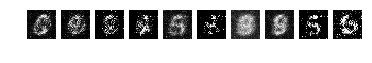

Epoch 293:


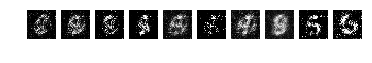

Epoch 294:


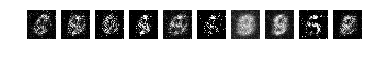

Epoch 295:


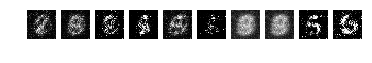

Epoch 296:


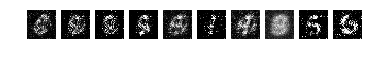

Epoch 297:


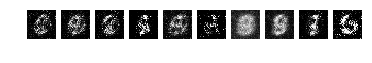

Epoch 298:


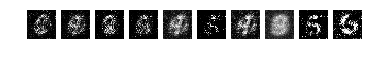

Epoch 299:


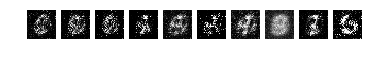

Epoch 300:


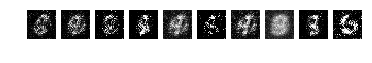

Epoch 301:


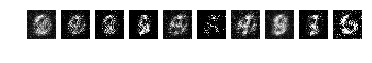

Epoch 302:


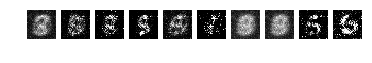

Epoch 303:


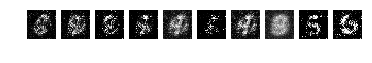

Epoch 304:


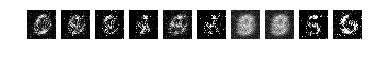

Epoch 305:


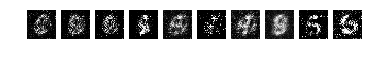

Epoch 306:


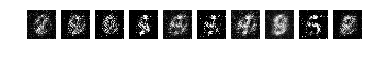

Epoch 307:


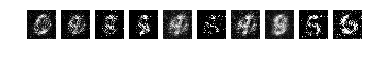

Epoch 308:


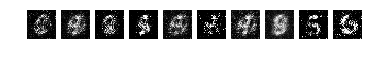

Epoch 309:


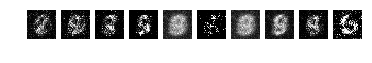

Epoch 310:


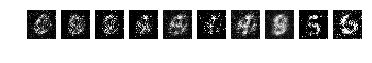

Epoch 311:


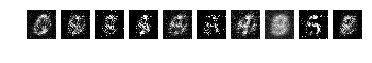

Epoch 312:


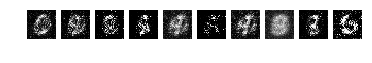

Epoch 313:


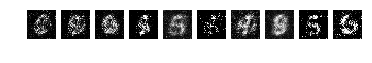

Epoch 314:


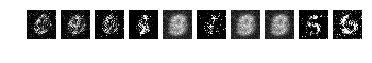

Epoch 315:


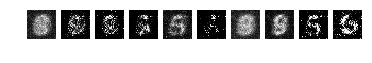

Epoch 316:


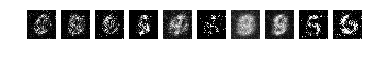

Epoch 317:


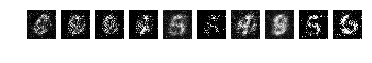

Epoch 318:


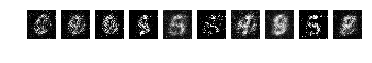

Epoch 319:


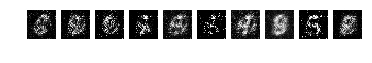

Epoch 320:


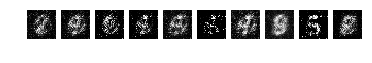

Epoch 321:


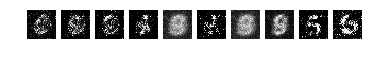

Epoch 322:


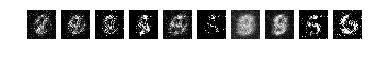

Epoch 323:


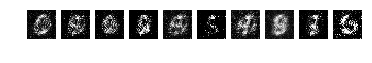

Epoch 324:


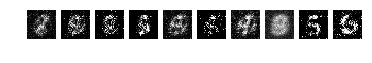

Epoch 325:


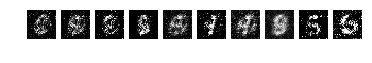

Epoch 326:


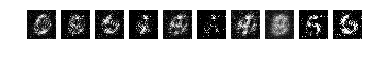

Epoch 327:


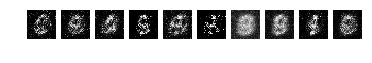

Epoch 328:


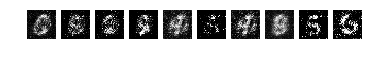

Epoch 329:


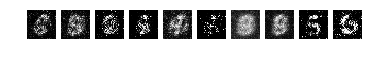

Epoch 330:


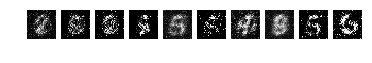

Epoch 331:


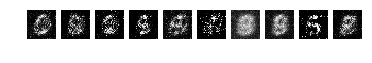

Epoch 332:


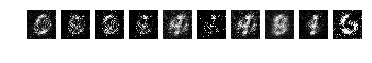

Epoch 333:


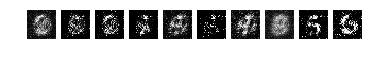

Epoch 334:


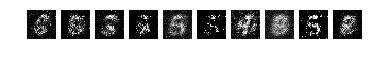

Epoch 335:


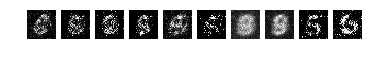

Epoch 336:


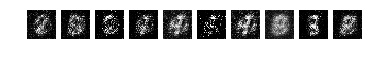

Epoch 337:


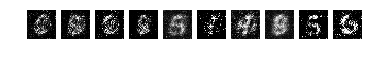

Epoch 338:


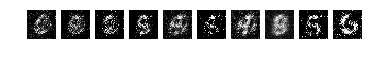

Epoch 339:


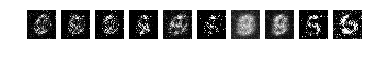

Epoch 340:


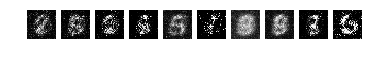

Epoch 341:


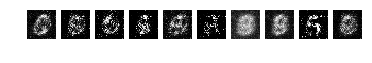

Epoch 342:


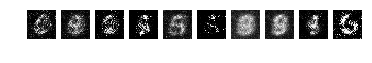

Epoch 343:


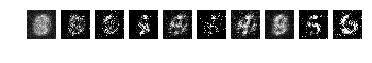

Epoch 344:


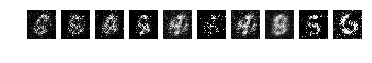

Epoch 345:


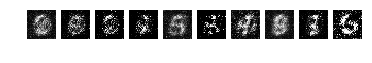

Epoch 346:


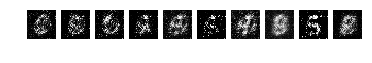

Epoch 347:


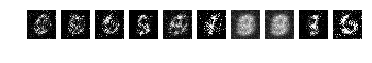

Epoch 348:


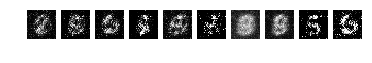

Epoch 349:


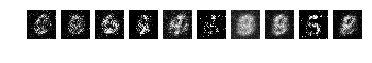

Epoch 350:


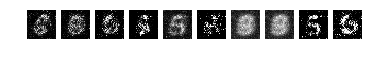

Epoch 351:


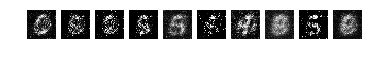

Epoch 352:


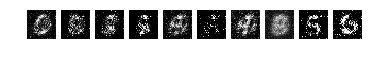

Epoch 353:


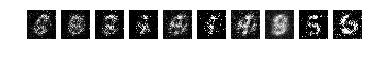

Epoch 354:


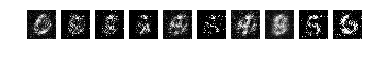

Epoch 355:


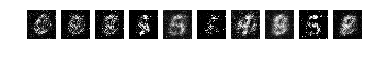

Epoch 356:


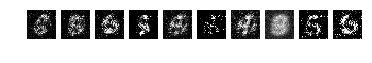

Epoch 357:


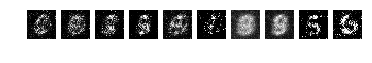

Epoch 358:


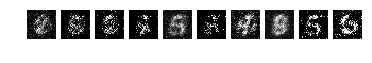

Epoch 359:


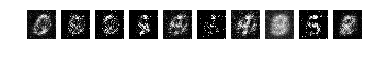

Epoch 360:


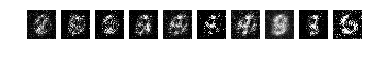

Epoch 361:


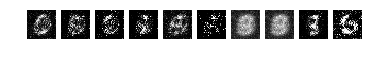

Epoch 362:


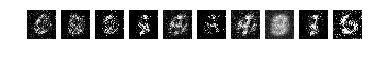

Epoch 363:


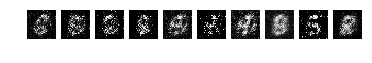

Epoch 364:


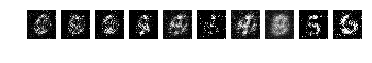

Epoch 365:


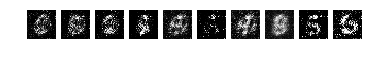

Epoch 366:


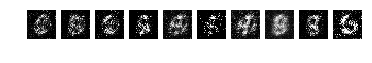

Epoch 367:


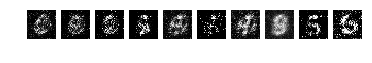

Epoch 368:


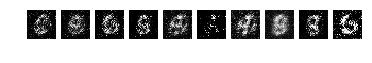

Epoch 369:


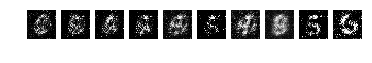

Epoch 370:


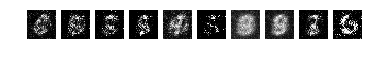

Epoch 371:


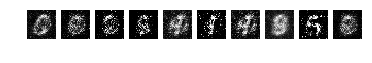

Epoch 372:


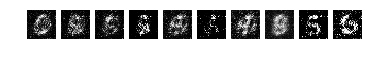

Epoch 373:


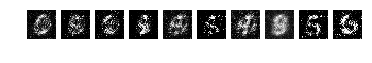

Epoch 374:


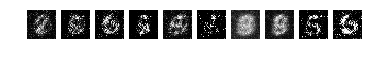

Epoch 375:


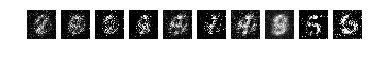

Epoch 376:


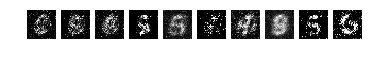

Epoch 377:


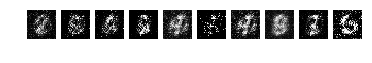

Epoch 378:


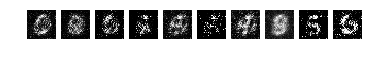

Epoch 379:


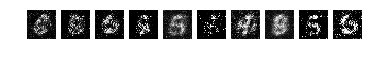

Epoch 380:


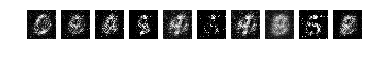

Epoch 381:


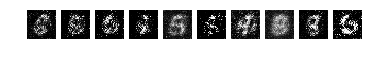

Epoch 382:


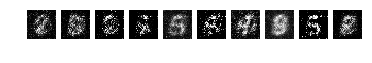

Epoch 383:


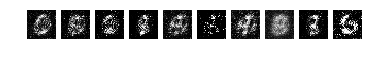

Epoch 384:


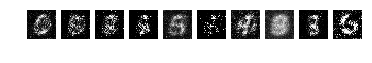

Epoch 385:


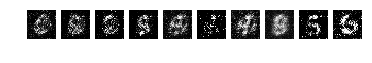

Epoch 386:


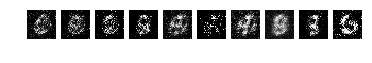

Epoch 387:


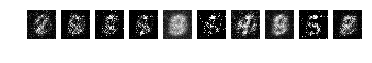

Epoch 388:


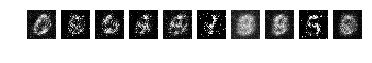

Epoch 389:


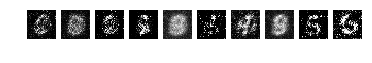

Epoch 390:


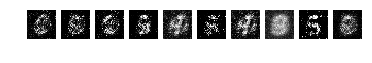

Epoch 391:


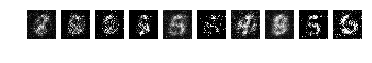

Epoch 392:


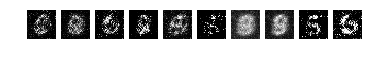

Epoch 393:


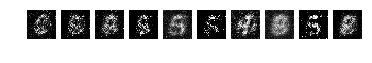

Epoch 394:


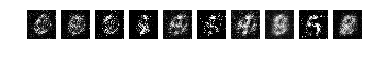

Epoch 395:


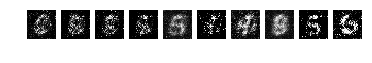

Epoch 396:


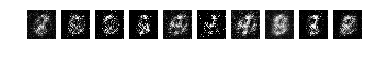

Epoch 397:


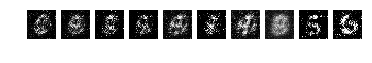

Epoch 398:


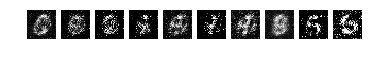

Epoch 399:


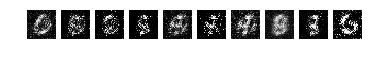

Epoch 400:


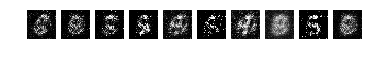

Epoch 401:


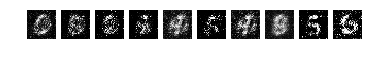

Epoch 402:


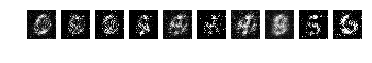

Epoch 403:


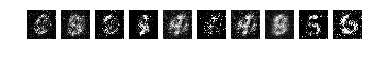

Epoch 404:


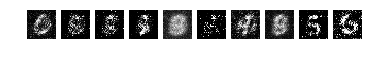

Epoch 405:


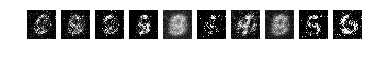

Epoch 406:


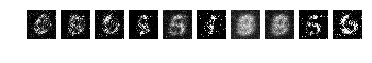

Epoch 407:


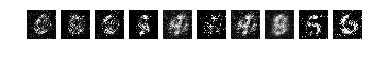

Epoch 408:


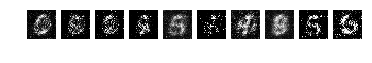

Epoch 409:


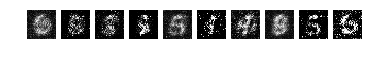

Epoch 410:


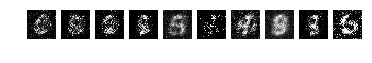

Epoch 411:


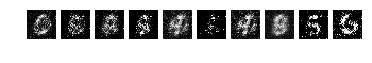

Epoch 412:


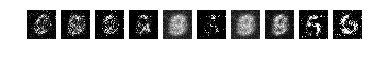

Epoch 413:


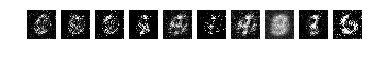

Epoch 414:


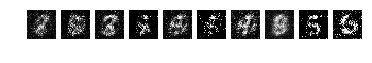

Epoch 415:


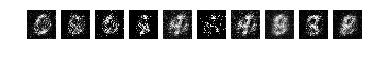

Epoch 416:


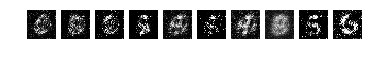

Epoch 417:


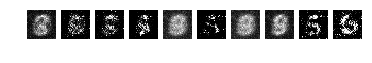

Epoch 418:


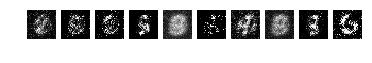

Epoch 419:


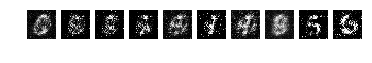

Epoch 420:


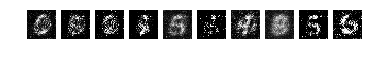

Epoch 421:


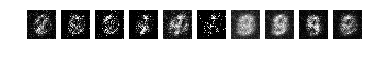

Epoch 422:


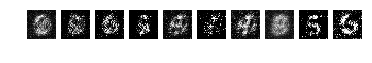

Epoch 423:


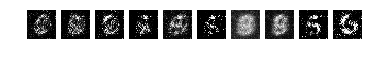

Epoch 424:


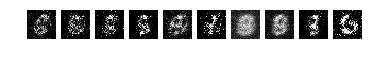

Epoch 425:


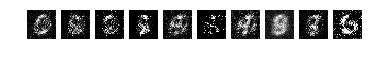

Epoch 426:


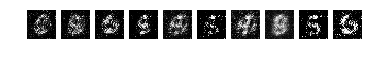

Epoch 427:


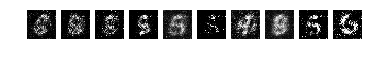

Epoch 428:


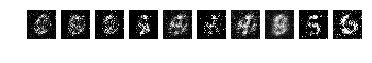

Epoch 429:


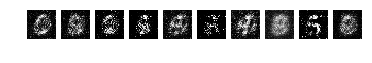

Epoch 430:


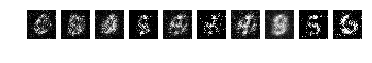

Epoch 431:


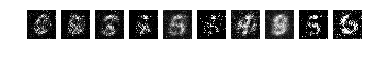

Epoch 432:


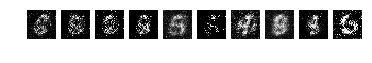

Epoch 433:


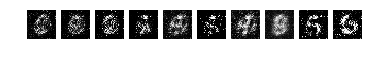

Epoch 434:


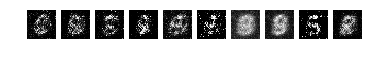

Epoch 435:


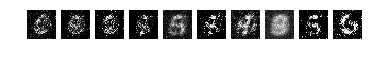

Epoch 436:


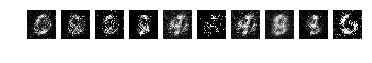

Epoch 437:


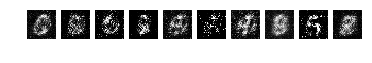

Epoch 438:


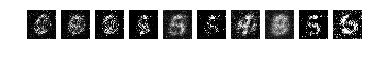

Epoch 439:


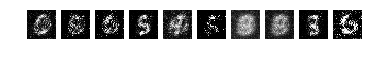

Epoch 440:


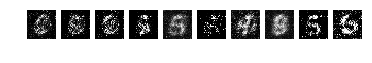

Epoch 441:


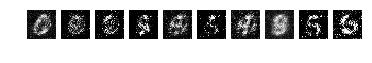

Epoch 442:


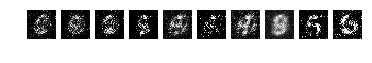

Epoch 443:


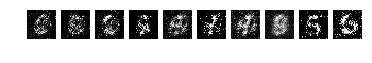

Epoch 444:


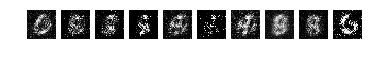

Epoch 445:


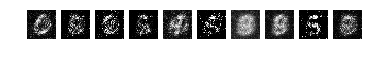

Epoch 446:


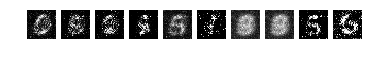

Epoch 447:


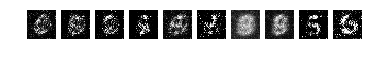

Epoch 448:


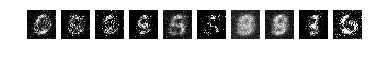

Epoch 449:


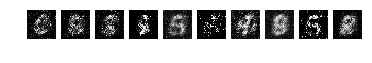

Epoch 450:


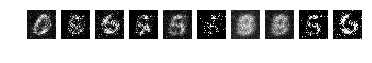

Epoch 451:


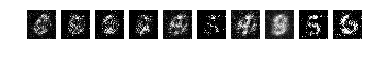

Epoch 452:


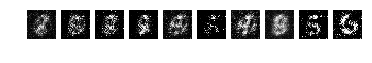

Epoch 453:


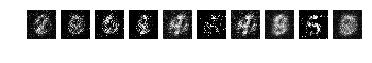

Epoch 454:


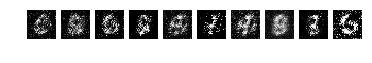

Epoch 455:


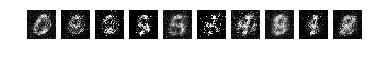

Epoch 456:


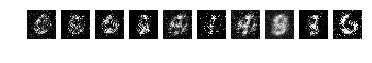

Epoch 457:


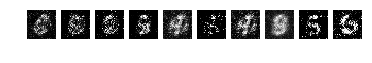

Epoch 458:


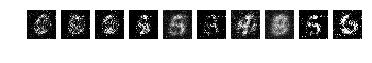

Epoch 459:


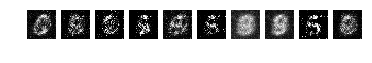

Epoch 460:


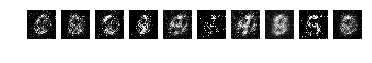

Epoch 461:


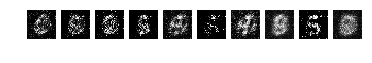

Epoch 462:


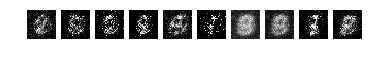

Epoch 463:


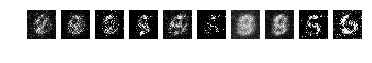

Epoch 464:


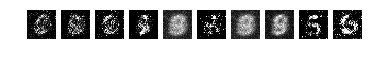

Epoch 465:


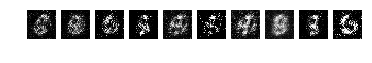

Epoch 466:


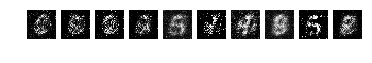

Epoch 467:


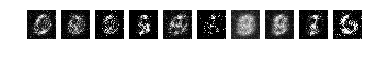

Epoch 468:


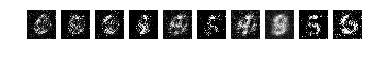

Epoch 469:


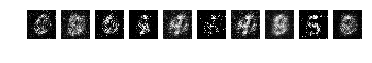

Epoch 470:


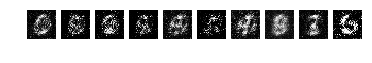

Epoch 471:


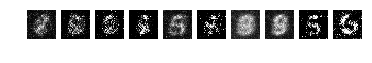

Epoch 472:


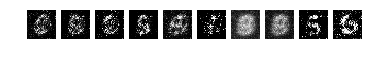

Epoch 473:


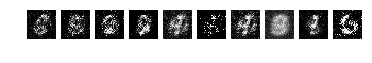

Epoch 474:


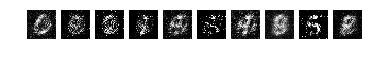

Epoch 475:


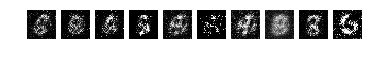

Epoch 476:


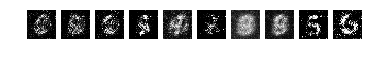

Epoch 477:


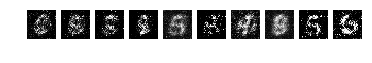

Epoch 478:


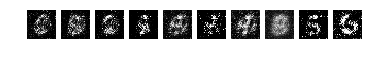

Epoch 479:


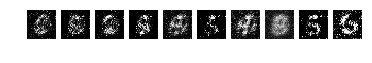

Epoch 480:


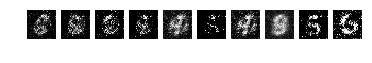

Epoch 481:


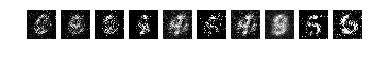

Epoch 482:


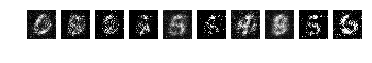

Epoch 483:


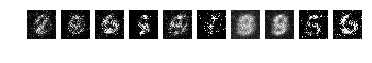

Epoch 484:


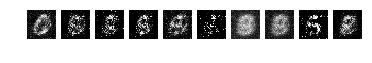

Epoch 485:


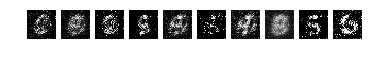

Epoch 486:


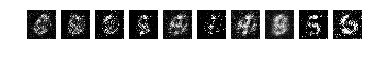

Epoch 487:


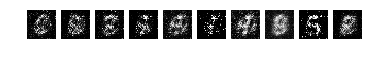

Epoch 488:


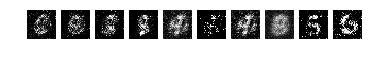

Epoch 489:


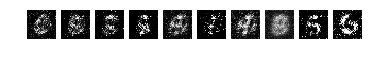

Epoch 490:


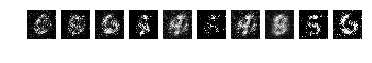

Epoch 491:


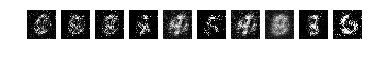

Epoch 492:


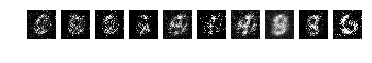

Epoch 493:


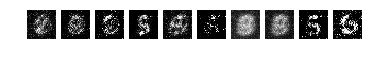

Epoch 494:


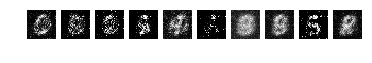

Epoch 495:


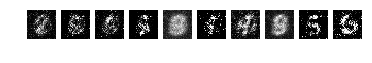

Epoch 496:


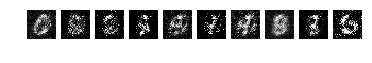

Epoch 497:


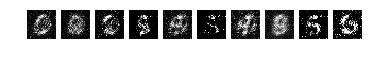

Epoch 498:


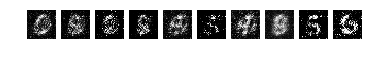

Epoch 499:


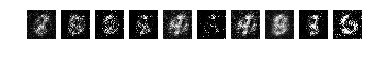

Epoch 500:


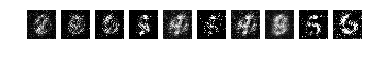

In [9]:
for i in range(hyperparams['epoch']):
    print('Epoch {}:'.format(i + 1))
    for j in range(hyperparams['sample_size']):
        plt.subplot(1, hyperparams['sample_size'], j + 1)
        plt.axis('off')
        plt.imshow(generate_sample_history[i, j].reshape(28, 28), cmap='gray')   
    plt.show()